# Adaptation on "Atlas-level integration of lung data" for the corneal meta-atlas and KCN datasets

This script was adapted from https://docs.scvi-tools.org/en/stable/tutorials/notebooks/scarches_scvi_tools.html#Visualize-reference-and-query with the corneal meta-atlas as a reference and KCN datasets as a query.


In [1]:
import sys

#if branch is stable, will install via pypi, else will install from source
#branch = "stable"
#IN_COLAB = "google.colab" in sys.modules

#if IN_COLAB and branch == "stable":
 #   !pip install --quiet scvi-tools[tutorials]
  #  !pip install --quiet git+https://github.com/theislab/scib.git
#elif IN_COLAB and branch != "stable":
 #   !pip install --quiet --upgrade jsonschema
  #  !pip install --quiet git+https://github.com/yoseflab/scvi-tools@$branch#egg=scvi-tools[tutorials]
   # !pip install --quiet git+https://github.com/theislab/scib.git

In [2]:
import matplotlib.pyplot as plt
import seaborn as sns
import numpy as np
import pandas as pd

import scanpy as sc
import scvi
import anndata
#import scib

sc.set_figure_params(figsize=(4, 4))

Global seed set to 0


Load in the reference dataset with the prespecified embeddings

In [3]:
adata_ref = sc.read("fullcornea_scVI_postprocessing.h5ad")

In [4]:
adata_ref

AnnData object with n_obs × n_vars = 65036 × 2000
    obs: 'orig.ident', 'nCount_RNA', 'nFeature_RNA', 'percent.mt', 'S.Score', 'G2M.Score', 'Phase', 'old.ident', 'RNA_snn_res.0.15', 'seurat_clusters', 'costum_clustering', 'Condition', 'pANN_0.25_0.06_1806', 'DF.classifications_0.25_0.06_1806', 'pANN_0.25_0.005_1289', 'DF.classifications_0.25_0.005_1289', 'RNA_snn_res.0.1', 'pANN_0.25_0.18_1347', 'DF.classifications_0.25_0.18_1347', 'pANN_0.25_0.14_831', 'DF.classifications_0.25_0.14_831', 'batch', '_scvi_batch', '_scvi_labels', 'leiden', 'leiden_0.0', 'leiden_0.05', 'leiden_0.1', 'leiden_0.15', 'leiden_0.2', 'leiden_0.25', 'leiden_0.3', 'leiden_0.35', 'leiden_0.4', 'leiden_0.45', 'leiden_0.5', 'leiden_0.55', 'leiden_0.6', 'leiden_0.65', 'leiden_0.7', 'leiden_0.75', 'leiden_0.8', 'leiden_0.85', 'leiden_0.9', 'leiden_0.95', 'leiden_anno'
    var: 'features', 'highly_variable', 'highly_variable_rank', 'means', 'variances', 'variances_norm', 'highly_variable_nbatches'
    uns: '_scvi', 'b

In [5]:
#vae_ref = scvi.model.SCVI(
#    adata_ref
#)

#vae_ref.train()

/vol/mbconda/julian/envs/scVItools/lib/python3.9/site-packages/scvi/model/base/_base_model.py:150: UserWarning: Make sure the registered X field in anndata contains unnormalized count data.
  warnings.warn(
GPU available: False, used: False
TPU available: False, using: 0 TPU cores


Epoch 1/123:   0%|                                                                                         | 0/123 [00:00<?, ?it/s]

/vol/mbconda/julian/envs/scVItools/lib/python3.9/site-packages/scvi/distributions/_negative_binomial.py:433: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(
/vol/mbconda/julian/envs/scVItools/lib/python3.9/site-packages/scvi/distributions/_negative_binomial.py:433: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(


Epoch 2/123:   1%|▌                                                             | 1/123 [00:08<17:23,  8.55s/it, loss=476, v_num=1]

/vol/mbconda/julian/envs/scVItools/lib/python3.9/site-packages/scvi/distributions/_negative_binomial.py:433: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(
/vol/mbconda/julian/envs/scVItools/lib/python3.9/site-packages/scvi/distributions/_negative_binomial.py:433: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(


Epoch 3/123:   2%|█                                                             | 2/123 [00:16<16:20,  8.10s/it, loss=451, v_num=1]

/vol/mbconda/julian/envs/scVItools/lib/python3.9/site-packages/scvi/distributions/_negative_binomial.py:433: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(
/vol/mbconda/julian/envs/scVItools/lib/python3.9/site-packages/scvi/distributions/_negative_binomial.py:433: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(


Epoch 4/123:   2%|█▌                                                            | 3/123 [00:24<15:49,  7.91s/it, loss=436, v_num=1]

/vol/mbconda/julian/envs/scVItools/lib/python3.9/site-packages/scvi/distributions/_negative_binomial.py:433: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(
/vol/mbconda/julian/envs/scVItools/lib/python3.9/site-packages/scvi/distributions/_negative_binomial.py:433: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(


Epoch 5/123:   3%|██                                                            | 4/123 [00:31<15:34,  7.85s/it, loss=425, v_num=1]

/vol/mbconda/julian/envs/scVItools/lib/python3.9/site-packages/scvi/distributions/_negative_binomial.py:433: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(
/vol/mbconda/julian/envs/scVItools/lib/python3.9/site-packages/scvi/distributions/_negative_binomial.py:433: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(


Epoch 6/123:   4%|██▌                                                           | 5/123 [00:39<15:24,  7.83s/it, loss=416, v_num=1]

/vol/mbconda/julian/envs/scVItools/lib/python3.9/site-packages/scvi/distributions/_negative_binomial.py:433: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(
/vol/mbconda/julian/envs/scVItools/lib/python3.9/site-packages/scvi/distributions/_negative_binomial.py:433: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(


Epoch 7/123:   5%|███                                                           | 6/123 [00:47<15:11,  7.79s/it, loss=410, v_num=1]

/vol/mbconda/julian/envs/scVItools/lib/python3.9/site-packages/scvi/distributions/_negative_binomial.py:433: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(
/vol/mbconda/julian/envs/scVItools/lib/python3.9/site-packages/scvi/distributions/_negative_binomial.py:433: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(


Epoch 8/123:   6%|███▌                                                          | 7/123 [00:54<14:57,  7.74s/it, loss=406, v_num=1]

/vol/mbconda/julian/envs/scVItools/lib/python3.9/site-packages/scvi/distributions/_negative_binomial.py:433: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(
/vol/mbconda/julian/envs/scVItools/lib/python3.9/site-packages/scvi/distributions/_negative_binomial.py:433: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(


Epoch 9/123:   7%|████                                                          | 8/123 [01:02<14:59,  7.82s/it, loss=401, v_num=1]

/vol/mbconda/julian/envs/scVItools/lib/python3.9/site-packages/scvi/distributions/_negative_binomial.py:433: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(
/vol/mbconda/julian/envs/scVItools/lib/python3.9/site-packages/scvi/distributions/_negative_binomial.py:433: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(


Epoch 10/123:   7%|████▍                                                        | 9/123 [01:11<15:24,  8.11s/it, loss=399, v_num=1]

/vol/mbconda/julian/envs/scVItools/lib/python3.9/site-packages/scvi/distributions/_negative_binomial.py:433: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(
/vol/mbconda/julian/envs/scVItools/lib/python3.9/site-packages/scvi/distributions/_negative_binomial.py:433: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(


Epoch 11/123:   8%|████▉                                                       | 10/123 [01:20<15:45,  8.36s/it, loss=394, v_num=1]

/vol/mbconda/julian/envs/scVItools/lib/python3.9/site-packages/scvi/distributions/_negative_binomial.py:433: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(
/vol/mbconda/julian/envs/scVItools/lib/python3.9/site-packages/scvi/distributions/_negative_binomial.py:433: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(


Epoch 12/123:   9%|█████▎                                                      | 11/123 [01:29<15:46,  8.45s/it, loss=394, v_num=1]

/vol/mbconda/julian/envs/scVItools/lib/python3.9/site-packages/scvi/distributions/_negative_binomial.py:433: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(
/vol/mbconda/julian/envs/scVItools/lib/python3.9/site-packages/scvi/distributions/_negative_binomial.py:433: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(


Epoch 13/123:  10%|█████▊                                                      | 12/123 [01:37<15:45,  8.51s/it, loss=392, v_num=1]

/vol/mbconda/julian/envs/scVItools/lib/python3.9/site-packages/scvi/distributions/_negative_binomial.py:433: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(
/vol/mbconda/julian/envs/scVItools/lib/python3.9/site-packages/scvi/distributions/_negative_binomial.py:433: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(


Epoch 14/123:  11%|██████▎                                                     | 13/123 [01:46<15:39,  8.54s/it, loss=389, v_num=1]

/vol/mbconda/julian/envs/scVItools/lib/python3.9/site-packages/scvi/distributions/_negative_binomial.py:433: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(
/vol/mbconda/julian/envs/scVItools/lib/python3.9/site-packages/scvi/distributions/_negative_binomial.py:433: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(


Epoch 15/123:  11%|██████▊                                                     | 14/123 [01:54<15:28,  8.52s/it, loss=391, v_num=1]

/vol/mbconda/julian/envs/scVItools/lib/python3.9/site-packages/scvi/distributions/_negative_binomial.py:433: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(
/vol/mbconda/julian/envs/scVItools/lib/python3.9/site-packages/scvi/distributions/_negative_binomial.py:433: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(


Epoch 16/123:  12%|███████▎                                                    | 15/123 [02:03<15:18,  8.50s/it, loss=390, v_num=1]

/vol/mbconda/julian/envs/scVItools/lib/python3.9/site-packages/scvi/distributions/_negative_binomial.py:433: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(
/vol/mbconda/julian/envs/scVItools/lib/python3.9/site-packages/scvi/distributions/_negative_binomial.py:433: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(


Epoch 17/123:  13%|███████▊                                                    | 16/123 [02:11<15:07,  8.48s/it, loss=389, v_num=1]

/vol/mbconda/julian/envs/scVItools/lib/python3.9/site-packages/scvi/distributions/_negative_binomial.py:433: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(
/vol/mbconda/julian/envs/scVItools/lib/python3.9/site-packages/scvi/distributions/_negative_binomial.py:433: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(


Epoch 18/123:  14%|████████▎                                                   | 17/123 [02:20<14:49,  8.39s/it, loss=389, v_num=1]

/vol/mbconda/julian/envs/scVItools/lib/python3.9/site-packages/scvi/distributions/_negative_binomial.py:433: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(
/vol/mbconda/julian/envs/scVItools/lib/python3.9/site-packages/scvi/distributions/_negative_binomial.py:433: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(


Epoch 19/123:  15%|████████▊                                                   | 18/123 [02:28<14:34,  8.32s/it, loss=387, v_num=1]

/vol/mbconda/julian/envs/scVItools/lib/python3.9/site-packages/scvi/distributions/_negative_binomial.py:433: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(
/vol/mbconda/julian/envs/scVItools/lib/python3.9/site-packages/scvi/distributions/_negative_binomial.py:433: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(


Epoch 20/123:  15%|█████████▎                                                  | 19/123 [02:36<14:28,  8.35s/it, loss=386, v_num=1]

/vol/mbconda/julian/envs/scVItools/lib/python3.9/site-packages/scvi/distributions/_negative_binomial.py:433: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(
/vol/mbconda/julian/envs/scVItools/lib/python3.9/site-packages/scvi/distributions/_negative_binomial.py:433: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(


Epoch 21/123:  16%|█████████▊                                                  | 20/123 [02:44<14:19,  8.34s/it, loss=386, v_num=1]

/vol/mbconda/julian/envs/scVItools/lib/python3.9/site-packages/scvi/distributions/_negative_binomial.py:433: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(
/vol/mbconda/julian/envs/scVItools/lib/python3.9/site-packages/scvi/distributions/_negative_binomial.py:433: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(


Epoch 22/123:  17%|██████████▏                                                 | 21/123 [02:53<14:11,  8.35s/it, loss=386, v_num=1]

/vol/mbconda/julian/envs/scVItools/lib/python3.9/site-packages/scvi/distributions/_negative_binomial.py:433: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(
/vol/mbconda/julian/envs/scVItools/lib/python3.9/site-packages/scvi/distributions/_negative_binomial.py:433: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(


Epoch 23/123:  18%|██████████▋                                                 | 22/123 [03:01<14:07,  8.39s/it, loss=386, v_num=1]

/vol/mbconda/julian/envs/scVItools/lib/python3.9/site-packages/scvi/distributions/_negative_binomial.py:433: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(
/vol/mbconda/julian/envs/scVItools/lib/python3.9/site-packages/scvi/distributions/_negative_binomial.py:433: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(


Epoch 24/123:  19%|███████████▏                                                | 23/123 [03:10<14:03,  8.44s/it, loss=387, v_num=1]

/vol/mbconda/julian/envs/scVItools/lib/python3.9/site-packages/scvi/distributions/_negative_binomial.py:433: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(
/vol/mbconda/julian/envs/scVItools/lib/python3.9/site-packages/scvi/distributions/_negative_binomial.py:433: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(


Epoch 25/123:  20%|███████████▋                                                | 24/123 [03:18<13:56,  8.45s/it, loss=386, v_num=1]

/vol/mbconda/julian/envs/scVItools/lib/python3.9/site-packages/scvi/distributions/_negative_binomial.py:433: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(
/vol/mbconda/julian/envs/scVItools/lib/python3.9/site-packages/scvi/distributions/_negative_binomial.py:433: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(


Epoch 26/123:  20%|████████████▏                                               | 25/123 [03:27<13:49,  8.46s/it, loss=387, v_num=1]

/vol/mbconda/julian/envs/scVItools/lib/python3.9/site-packages/scvi/distributions/_negative_binomial.py:433: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(
/vol/mbconda/julian/envs/scVItools/lib/python3.9/site-packages/scvi/distributions/_negative_binomial.py:433: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(


Epoch 27/123:  21%|████████████▋                                               | 26/123 [03:35<13:43,  8.49s/it, loss=385, v_num=1]

/vol/mbconda/julian/envs/scVItools/lib/python3.9/site-packages/scvi/distributions/_negative_binomial.py:433: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(
/vol/mbconda/julian/envs/scVItools/lib/python3.9/site-packages/scvi/distributions/_negative_binomial.py:433: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(


Epoch 28/123:  22%|█████████████▏                                              | 27/123 [03:44<13:33,  8.48s/it, loss=385, v_num=1]

/vol/mbconda/julian/envs/scVItools/lib/python3.9/site-packages/scvi/distributions/_negative_binomial.py:433: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(
/vol/mbconda/julian/envs/scVItools/lib/python3.9/site-packages/scvi/distributions/_negative_binomial.py:433: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(


Epoch 29/123:  23%|█████████████▋                                              | 28/123 [03:52<13:26,  8.49s/it, loss=387, v_num=1]

/vol/mbconda/julian/envs/scVItools/lib/python3.9/site-packages/scvi/distributions/_negative_binomial.py:433: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(
/vol/mbconda/julian/envs/scVItools/lib/python3.9/site-packages/scvi/distributions/_negative_binomial.py:433: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(


Epoch 30/123:  24%|██████████████▏                                             | 29/123 [04:01<13:19,  8.51s/it, loss=385, v_num=1]

/vol/mbconda/julian/envs/scVItools/lib/python3.9/site-packages/scvi/distributions/_negative_binomial.py:433: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(
/vol/mbconda/julian/envs/scVItools/lib/python3.9/site-packages/scvi/distributions/_negative_binomial.py:433: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(


Epoch 31/123:  24%|██████████████▋                                             | 30/123 [04:09<13:08,  8.48s/it, loss=387, v_num=1]

/vol/mbconda/julian/envs/scVItools/lib/python3.9/site-packages/scvi/distributions/_negative_binomial.py:433: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(
/vol/mbconda/julian/envs/scVItools/lib/python3.9/site-packages/scvi/distributions/_negative_binomial.py:433: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(


Epoch 32/123:  25%|███████████████                                             | 31/123 [04:18<13:00,  8.49s/it, loss=385, v_num=1]

/vol/mbconda/julian/envs/scVItools/lib/python3.9/site-packages/scvi/distributions/_negative_binomial.py:433: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(
/vol/mbconda/julian/envs/scVItools/lib/python3.9/site-packages/scvi/distributions/_negative_binomial.py:433: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(


Epoch 33/123:  26%|███████████████▌                                            | 32/123 [04:26<12:48,  8.44s/it, loss=385, v_num=1]

/vol/mbconda/julian/envs/scVItools/lib/python3.9/site-packages/scvi/distributions/_negative_binomial.py:433: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(
/vol/mbconda/julian/envs/scVItools/lib/python3.9/site-packages/scvi/distributions/_negative_binomial.py:433: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(


Epoch 34/123:  27%|████████████████                                            | 33/123 [04:34<12:33,  8.37s/it, loss=386, v_num=1]

/vol/mbconda/julian/envs/scVItools/lib/python3.9/site-packages/scvi/distributions/_negative_binomial.py:433: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(
/vol/mbconda/julian/envs/scVItools/lib/python3.9/site-packages/scvi/distributions/_negative_binomial.py:433: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(


Epoch 35/123:  28%|████████████████▌                                           | 34/123 [04:43<12:18,  8.30s/it, loss=383, v_num=1]

/vol/mbconda/julian/envs/scVItools/lib/python3.9/site-packages/scvi/distributions/_negative_binomial.py:433: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(
/vol/mbconda/julian/envs/scVItools/lib/python3.9/site-packages/scvi/distributions/_negative_binomial.py:433: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(


Epoch 36/123:  28%|█████████████████                                           | 35/123 [04:51<12:09,  8.29s/it, loss=386, v_num=1]

/vol/mbconda/julian/envs/scVItools/lib/python3.9/site-packages/scvi/distributions/_negative_binomial.py:433: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(
/vol/mbconda/julian/envs/scVItools/lib/python3.9/site-packages/scvi/distributions/_negative_binomial.py:433: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(


Epoch 37/123:  29%|█████████████████▌                                          | 36/123 [04:59<11:57,  8.25s/it, loss=385, v_num=1]

/vol/mbconda/julian/envs/scVItools/lib/python3.9/site-packages/scvi/distributions/_negative_binomial.py:433: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(
/vol/mbconda/julian/envs/scVItools/lib/python3.9/site-packages/scvi/distributions/_negative_binomial.py:433: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(


Epoch 38/123:  30%|██████████████████                                          | 37/123 [05:07<11:43,  8.18s/it, loss=385, v_num=1]

/vol/mbconda/julian/envs/scVItools/lib/python3.9/site-packages/scvi/distributions/_negative_binomial.py:433: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(
/vol/mbconda/julian/envs/scVItools/lib/python3.9/site-packages/scvi/distributions/_negative_binomial.py:433: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(


Epoch 39/123:  31%|██████████████████▌                                         | 38/123 [05:15<11:34,  8.17s/it, loss=385, v_num=1]

/vol/mbconda/julian/envs/scVItools/lib/python3.9/site-packages/scvi/distributions/_negative_binomial.py:433: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(
/vol/mbconda/julian/envs/scVItools/lib/python3.9/site-packages/scvi/distributions/_negative_binomial.py:433: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(


Epoch 40/123:  32%|███████████████████                                         | 39/123 [05:23<11:23,  8.13s/it, loss=384, v_num=1]

/vol/mbconda/julian/envs/scVItools/lib/python3.9/site-packages/scvi/distributions/_negative_binomial.py:433: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(
/vol/mbconda/julian/envs/scVItools/lib/python3.9/site-packages/scvi/distributions/_negative_binomial.py:433: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(


Epoch 41/123:  33%|███████████████████▌                                        | 40/123 [05:32<11:26,  8.27s/it, loss=386, v_num=1]

/vol/mbconda/julian/envs/scVItools/lib/python3.9/site-packages/scvi/distributions/_negative_binomial.py:433: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(
/vol/mbconda/julian/envs/scVItools/lib/python3.9/site-packages/scvi/distributions/_negative_binomial.py:433: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(


Epoch 42/123:  33%|████████████████████                                        | 41/123 [05:40<11:23,  8.34s/it, loss=387, v_num=1]

/vol/mbconda/julian/envs/scVItools/lib/python3.9/site-packages/scvi/distributions/_negative_binomial.py:433: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(
/vol/mbconda/julian/envs/scVItools/lib/python3.9/site-packages/scvi/distributions/_negative_binomial.py:433: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(


Epoch 43/123:  34%|████████████████████▍                                       | 42/123 [05:49<11:14,  8.33s/it, loss=383, v_num=1]

/vol/mbconda/julian/envs/scVItools/lib/python3.9/site-packages/scvi/distributions/_negative_binomial.py:433: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(
/vol/mbconda/julian/envs/scVItools/lib/python3.9/site-packages/scvi/distributions/_negative_binomial.py:433: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(


Epoch 44/123:  35%|████████████████████▉                                       | 43/123 [05:57<11:07,  8.35s/it, loss=386, v_num=1]

/vol/mbconda/julian/envs/scVItools/lib/python3.9/site-packages/scvi/distributions/_negative_binomial.py:433: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(
/vol/mbconda/julian/envs/scVItools/lib/python3.9/site-packages/scvi/distributions/_negative_binomial.py:433: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(


Epoch 45/123:  36%|█████████████████████▍                                      | 44/123 [06:05<10:56,  8.31s/it, loss=383, v_num=1]

/vol/mbconda/julian/envs/scVItools/lib/python3.9/site-packages/scvi/distributions/_negative_binomial.py:433: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(
/vol/mbconda/julian/envs/scVItools/lib/python3.9/site-packages/scvi/distributions/_negative_binomial.py:433: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(


Epoch 46/123:  37%|█████████████████████▉                                      | 45/123 [06:13<10:48,  8.31s/it, loss=385, v_num=1]

/vol/mbconda/julian/envs/scVItools/lib/python3.9/site-packages/scvi/distributions/_negative_binomial.py:433: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(
/vol/mbconda/julian/envs/scVItools/lib/python3.9/site-packages/scvi/distributions/_negative_binomial.py:433: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(


Epoch 47/123:  37%|██████████████████████▍                                     | 46/123 [06:22<10:45,  8.38s/it, loss=385, v_num=1]

/vol/mbconda/julian/envs/scVItools/lib/python3.9/site-packages/scvi/distributions/_negative_binomial.py:433: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(
/vol/mbconda/julian/envs/scVItools/lib/python3.9/site-packages/scvi/distributions/_negative_binomial.py:433: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(


Epoch 48/123:  38%|██████████████████████▉                                     | 47/123 [06:30<10:34,  8.35s/it, loss=385, v_num=1]

/vol/mbconda/julian/envs/scVItools/lib/python3.9/site-packages/scvi/distributions/_negative_binomial.py:433: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(
/vol/mbconda/julian/envs/scVItools/lib/python3.9/site-packages/scvi/distributions/_negative_binomial.py:433: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(


Epoch 49/123:  39%|███████████████████████▍                                    | 48/123 [06:39<10:23,  8.32s/it, loss=385, v_num=1]

/vol/mbconda/julian/envs/scVItools/lib/python3.9/site-packages/scvi/distributions/_negative_binomial.py:433: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(
/vol/mbconda/julian/envs/scVItools/lib/python3.9/site-packages/scvi/distributions/_negative_binomial.py:433: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(


Epoch 50/123:  40%|███████████████████████▉                                    | 49/123 [06:47<10:14,  8.30s/it, loss=383, v_num=1]

/vol/mbconda/julian/envs/scVItools/lib/python3.9/site-packages/scvi/distributions/_negative_binomial.py:433: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(
/vol/mbconda/julian/envs/scVItools/lib/python3.9/site-packages/scvi/distributions/_negative_binomial.py:433: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(


Epoch 51/123:  41%|████████████████████████▍                                   | 50/123 [06:55<10:03,  8.27s/it, loss=387, v_num=1]

/vol/mbconda/julian/envs/scVItools/lib/python3.9/site-packages/scvi/distributions/_negative_binomial.py:433: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(
/vol/mbconda/julian/envs/scVItools/lib/python3.9/site-packages/scvi/distributions/_negative_binomial.py:433: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(


Epoch 52/123:  41%|████████████████████████▉                                   | 51/123 [07:03<09:54,  8.26s/it, loss=385, v_num=1]

/vol/mbconda/julian/envs/scVItools/lib/python3.9/site-packages/scvi/distributions/_negative_binomial.py:433: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(
/vol/mbconda/julian/envs/scVItools/lib/python3.9/site-packages/scvi/distributions/_negative_binomial.py:433: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(


Epoch 53/123:  42%|█████████████████████████▎                                  | 52/123 [07:11<09:45,  8.24s/it, loss=385, v_num=1]

/vol/mbconda/julian/envs/scVItools/lib/python3.9/site-packages/scvi/distributions/_negative_binomial.py:433: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(
/vol/mbconda/julian/envs/scVItools/lib/python3.9/site-packages/scvi/distributions/_negative_binomial.py:433: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(


Epoch 54/123:  43%|█████████████████████████▊                                  | 53/123 [07:19<09:31,  8.17s/it, loss=387, v_num=1]

/vol/mbconda/julian/envs/scVItools/lib/python3.9/site-packages/scvi/distributions/_negative_binomial.py:433: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(
/vol/mbconda/julian/envs/scVItools/lib/python3.9/site-packages/scvi/distributions/_negative_binomial.py:433: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(


Epoch 55/123:  44%|██████████████████████████▎                                 | 54/123 [07:28<09:21,  8.14s/it, loss=386, v_num=1]

/vol/mbconda/julian/envs/scVItools/lib/python3.9/site-packages/scvi/distributions/_negative_binomial.py:433: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(
/vol/mbconda/julian/envs/scVItools/lib/python3.9/site-packages/scvi/distributions/_negative_binomial.py:433: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(


Epoch 56/123:  45%|██████████████████████████▊                                 | 55/123 [07:36<09:11,  8.10s/it, loss=385, v_num=1]

/vol/mbconda/julian/envs/scVItools/lib/python3.9/site-packages/scvi/distributions/_negative_binomial.py:433: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(
/vol/mbconda/julian/envs/scVItools/lib/python3.9/site-packages/scvi/distributions/_negative_binomial.py:433: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(


Epoch 57/123:  46%|███████████████████████████▎                                | 56/123 [07:44<09:02,  8.10s/it, loss=385, v_num=1]

/vol/mbconda/julian/envs/scVItools/lib/python3.9/site-packages/scvi/distributions/_negative_binomial.py:433: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(
/vol/mbconda/julian/envs/scVItools/lib/python3.9/site-packages/scvi/distributions/_negative_binomial.py:433: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(


Epoch 58/123:  46%|███████████████████████████▊                                | 57/123 [07:52<08:53,  8.08s/it, loss=385, v_num=1]

/vol/mbconda/julian/envs/scVItools/lib/python3.9/site-packages/scvi/distributions/_negative_binomial.py:433: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(
/vol/mbconda/julian/envs/scVItools/lib/python3.9/site-packages/scvi/distributions/_negative_binomial.py:433: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(


Epoch 59/123:  47%|████████████████████████████▎                               | 58/123 [08:00<08:47,  8.11s/it, loss=384, v_num=1]

/vol/mbconda/julian/envs/scVItools/lib/python3.9/site-packages/scvi/distributions/_negative_binomial.py:433: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(
/vol/mbconda/julian/envs/scVItools/lib/python3.9/site-packages/scvi/distributions/_negative_binomial.py:433: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(


Epoch 60/123:  48%|████████████████████████████▊                               | 59/123 [08:08<08:40,  8.13s/it, loss=387, v_num=1]

/vol/mbconda/julian/envs/scVItools/lib/python3.9/site-packages/scvi/distributions/_negative_binomial.py:433: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(
/vol/mbconda/julian/envs/scVItools/lib/python3.9/site-packages/scvi/distributions/_negative_binomial.py:433: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(


Epoch 61/123:  49%|█████████████████████████████▎                              | 60/123 [08:16<08:37,  8.22s/it, loss=385, v_num=1]

/vol/mbconda/julian/envs/scVItools/lib/python3.9/site-packages/scvi/distributions/_negative_binomial.py:433: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(
/vol/mbconda/julian/envs/scVItools/lib/python3.9/site-packages/scvi/distributions/_negative_binomial.py:433: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(


Epoch 62/123:  50%|█████████████████████████████▊                              | 61/123 [08:25<08:32,  8.27s/it, loss=385, v_num=1]

/vol/mbconda/julian/envs/scVItools/lib/python3.9/site-packages/scvi/distributions/_negative_binomial.py:433: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(
/vol/mbconda/julian/envs/scVItools/lib/python3.9/site-packages/scvi/distributions/_negative_binomial.py:433: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(


Epoch 63/123:  50%|██████████████████████████████▏                             | 62/123 [08:33<08:27,  8.32s/it, loss=386, v_num=1]

/vol/mbconda/julian/envs/scVItools/lib/python3.9/site-packages/scvi/distributions/_negative_binomial.py:433: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(
/vol/mbconda/julian/envs/scVItools/lib/python3.9/site-packages/scvi/distributions/_negative_binomial.py:433: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(


Epoch 64/123:  51%|██████████████████████████████▋                             | 63/123 [08:42<08:18,  8.30s/it, loss=386, v_num=1]

/vol/mbconda/julian/envs/scVItools/lib/python3.9/site-packages/scvi/distributions/_negative_binomial.py:433: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(
/vol/mbconda/julian/envs/scVItools/lib/python3.9/site-packages/scvi/distributions/_negative_binomial.py:433: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(


Epoch 65/123:  52%|███████████████████████████████▏                            | 64/123 [08:50<08:08,  8.29s/it, loss=386, v_num=1]

/vol/mbconda/julian/envs/scVItools/lib/python3.9/site-packages/scvi/distributions/_negative_binomial.py:433: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(
/vol/mbconda/julian/envs/scVItools/lib/python3.9/site-packages/scvi/distributions/_negative_binomial.py:433: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(


Epoch 66/123:  53%|███████████████████████████████▋                            | 65/123 [08:58<08:00,  8.28s/it, loss=386, v_num=1]

/vol/mbconda/julian/envs/scVItools/lib/python3.9/site-packages/scvi/distributions/_negative_binomial.py:433: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(
/vol/mbconda/julian/envs/scVItools/lib/python3.9/site-packages/scvi/distributions/_negative_binomial.py:433: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(


Epoch 67/123:  54%|████████████████████████████████▏                           | 66/123 [09:06<07:52,  8.29s/it, loss=385, v_num=1]

/vol/mbconda/julian/envs/scVItools/lib/python3.9/site-packages/scvi/distributions/_negative_binomial.py:433: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(
/vol/mbconda/julian/envs/scVItools/lib/python3.9/site-packages/scvi/distributions/_negative_binomial.py:433: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(


Epoch 68/123:  54%|████████████████████████████████▋                           | 67/123 [09:15<07:43,  8.28s/it, loss=387, v_num=1]

/vol/mbconda/julian/envs/scVItools/lib/python3.9/site-packages/scvi/distributions/_negative_binomial.py:433: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(
/vol/mbconda/julian/envs/scVItools/lib/python3.9/site-packages/scvi/distributions/_negative_binomial.py:433: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(


Epoch 69/123:  55%|█████████████████████████████████▏                          | 68/123 [09:23<07:38,  8.33s/it, loss=386, v_num=1]

/vol/mbconda/julian/envs/scVItools/lib/python3.9/site-packages/scvi/distributions/_negative_binomial.py:433: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(
/vol/mbconda/julian/envs/scVItools/lib/python3.9/site-packages/scvi/distributions/_negative_binomial.py:433: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(


Epoch 70/123:  56%|█████████████████████████████████▋                          | 69/123 [09:31<07:26,  8.26s/it, loss=385, v_num=1]

/vol/mbconda/julian/envs/scVItools/lib/python3.9/site-packages/scvi/distributions/_negative_binomial.py:433: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(
/vol/mbconda/julian/envs/scVItools/lib/python3.9/site-packages/scvi/distributions/_negative_binomial.py:433: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(


Epoch 71/123:  57%|██████████████████████████████████▏                         | 70/123 [09:40<07:19,  8.29s/it, loss=384, v_num=1]

/vol/mbconda/julian/envs/scVItools/lib/python3.9/site-packages/scvi/distributions/_negative_binomial.py:433: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(
/vol/mbconda/julian/envs/scVItools/lib/python3.9/site-packages/scvi/distributions/_negative_binomial.py:433: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(


Epoch 72/123:  58%|██████████████████████████████████▋                         | 71/123 [09:48<07:09,  8.27s/it, loss=387, v_num=1]

/vol/mbconda/julian/envs/scVItools/lib/python3.9/site-packages/scvi/distributions/_negative_binomial.py:433: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(
/vol/mbconda/julian/envs/scVItools/lib/python3.9/site-packages/scvi/distributions/_negative_binomial.py:433: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(


Epoch 73/123:  59%|███████████████████████████████████                         | 72/123 [09:56<06:57,  8.18s/it, loss=387, v_num=1]

/vol/mbconda/julian/envs/scVItools/lib/python3.9/site-packages/scvi/distributions/_negative_binomial.py:433: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(
/vol/mbconda/julian/envs/scVItools/lib/python3.9/site-packages/scvi/distributions/_negative_binomial.py:433: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(


Epoch 74/123:  59%|███████████████████████████████████▌                        | 73/123 [10:04<06:46,  8.14s/it, loss=385, v_num=1]

/vol/mbconda/julian/envs/scVItools/lib/python3.9/site-packages/scvi/distributions/_negative_binomial.py:433: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(
/vol/mbconda/julian/envs/scVItools/lib/python3.9/site-packages/scvi/distributions/_negative_binomial.py:433: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(


Epoch 75/123:  60%|████████████████████████████████████                        | 74/123 [10:12<06:37,  8.11s/it, loss=387, v_num=1]

/vol/mbconda/julian/envs/scVItools/lib/python3.9/site-packages/scvi/distributions/_negative_binomial.py:433: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(
/vol/mbconda/julian/envs/scVItools/lib/python3.9/site-packages/scvi/distributions/_negative_binomial.py:433: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(


Epoch 76/123:  61%|████████████████████████████████████▌                       | 75/123 [10:20<06:26,  8.04s/it, loss=387, v_num=1]

/vol/mbconda/julian/envs/scVItools/lib/python3.9/site-packages/scvi/distributions/_negative_binomial.py:433: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(
/vol/mbconda/julian/envs/scVItools/lib/python3.9/site-packages/scvi/distributions/_negative_binomial.py:433: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(


Epoch 77/123:  62%|█████████████████████████████████████                       | 76/123 [10:28<06:19,  8.07s/it, loss=384, v_num=1]

/vol/mbconda/julian/envs/scVItools/lib/python3.9/site-packages/scvi/distributions/_negative_binomial.py:433: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(
/vol/mbconda/julian/envs/scVItools/lib/python3.9/site-packages/scvi/distributions/_negative_binomial.py:433: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(


Epoch 78/123:  63%|█████████████████████████████████████▌                      | 77/123 [10:36<06:13,  8.11s/it, loss=386, v_num=1]

/vol/mbconda/julian/envs/scVItools/lib/python3.9/site-packages/scvi/distributions/_negative_binomial.py:433: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(
/vol/mbconda/julian/envs/scVItools/lib/python3.9/site-packages/scvi/distributions/_negative_binomial.py:433: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(


Epoch 79/123:  63%|██████████████████████████████████████                      | 78/123 [10:44<06:04,  8.11s/it, loss=385, v_num=1]

/vol/mbconda/julian/envs/scVItools/lib/python3.9/site-packages/scvi/distributions/_negative_binomial.py:433: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(
/vol/mbconda/julian/envs/scVItools/lib/python3.9/site-packages/scvi/distributions/_negative_binomial.py:433: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(


Epoch 80/123:  64%|██████████████████████████████████████▌                     | 79/123 [10:52<05:58,  8.16s/it, loss=387, v_num=1]

/vol/mbconda/julian/envs/scVItools/lib/python3.9/site-packages/scvi/distributions/_negative_binomial.py:433: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(
/vol/mbconda/julian/envs/scVItools/lib/python3.9/site-packages/scvi/distributions/_negative_binomial.py:433: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(


Epoch 81/123:  65%|███████████████████████████████████████                     | 80/123 [11:01<05:51,  8.17s/it, loss=387, v_num=1]

/vol/mbconda/julian/envs/scVItools/lib/python3.9/site-packages/scvi/distributions/_negative_binomial.py:433: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(
/vol/mbconda/julian/envs/scVItools/lib/python3.9/site-packages/scvi/distributions/_negative_binomial.py:433: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(


Epoch 82/123:  66%|███████████████████████████████████████▌                    | 81/123 [11:09<05:44,  8.19s/it, loss=385, v_num=1]

/vol/mbconda/julian/envs/scVItools/lib/python3.9/site-packages/scvi/distributions/_negative_binomial.py:433: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(
/vol/mbconda/julian/envs/scVItools/lib/python3.9/site-packages/scvi/distributions/_negative_binomial.py:433: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(


Epoch 83/123:  67%|████████████████████████████████████████                    | 82/123 [11:17<05:36,  8.21s/it, loss=386, v_num=1]

/vol/mbconda/julian/envs/scVItools/lib/python3.9/site-packages/scvi/distributions/_negative_binomial.py:433: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(
/vol/mbconda/julian/envs/scVItools/lib/python3.9/site-packages/scvi/distributions/_negative_binomial.py:433: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(


Epoch 84/123:  67%|████████████████████████████████████████▍                   | 83/123 [11:25<05:29,  8.24s/it, loss=386, v_num=1]

/vol/mbconda/julian/envs/scVItools/lib/python3.9/site-packages/scvi/distributions/_negative_binomial.py:433: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(
/vol/mbconda/julian/envs/scVItools/lib/python3.9/site-packages/scvi/distributions/_negative_binomial.py:433: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(


Epoch 85/123:  68%|████████████████████████████████████████▉                   | 84/123 [11:34<05:22,  8.27s/it, loss=387, v_num=1]

/vol/mbconda/julian/envs/scVItools/lib/python3.9/site-packages/scvi/distributions/_negative_binomial.py:433: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(
/vol/mbconda/julian/envs/scVItools/lib/python3.9/site-packages/scvi/distributions/_negative_binomial.py:433: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(


Epoch 86/123:  69%|█████████████████████████████████████████▍                  | 85/123 [11:42<05:16,  8.34s/it, loss=387, v_num=1]

/vol/mbconda/julian/envs/scVItools/lib/python3.9/site-packages/scvi/distributions/_negative_binomial.py:433: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(
/vol/mbconda/julian/envs/scVItools/lib/python3.9/site-packages/scvi/distributions/_negative_binomial.py:433: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(


Epoch 87/123:  70%|█████████████████████████████████████████▉                  | 86/123 [11:51<05:11,  8.43s/it, loss=386, v_num=1]

/vol/mbconda/julian/envs/scVItools/lib/python3.9/site-packages/scvi/distributions/_negative_binomial.py:433: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(
/vol/mbconda/julian/envs/scVItools/lib/python3.9/site-packages/scvi/distributions/_negative_binomial.py:433: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(


Epoch 88/123:  71%|██████████████████████████████████████████▍                 | 87/123 [11:59<05:05,  8.48s/it, loss=385, v_num=1]

/vol/mbconda/julian/envs/scVItools/lib/python3.9/site-packages/scvi/distributions/_negative_binomial.py:433: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(
/vol/mbconda/julian/envs/scVItools/lib/python3.9/site-packages/scvi/distributions/_negative_binomial.py:433: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(


Epoch 89/123:  72%|██████████████████████████████████████████▉                 | 88/123 [12:08<04:56,  8.47s/it, loss=386, v_num=1]

/vol/mbconda/julian/envs/scVItools/lib/python3.9/site-packages/scvi/distributions/_negative_binomial.py:433: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(
/vol/mbconda/julian/envs/scVItools/lib/python3.9/site-packages/scvi/distributions/_negative_binomial.py:433: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(


Epoch 90/123:  72%|███████████████████████████████████████████▍                | 89/123 [12:16<04:47,  8.46s/it, loss=386, v_num=1]

/vol/mbconda/julian/envs/scVItools/lib/python3.9/site-packages/scvi/distributions/_negative_binomial.py:433: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(
/vol/mbconda/julian/envs/scVItools/lib/python3.9/site-packages/scvi/distributions/_negative_binomial.py:433: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(


Epoch 91/123:  73%|███████████████████████████████████████████▉                | 90/123 [12:25<04:39,  8.47s/it, loss=387, v_num=1]

/vol/mbconda/julian/envs/scVItools/lib/python3.9/site-packages/scvi/distributions/_negative_binomial.py:433: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(
/vol/mbconda/julian/envs/scVItools/lib/python3.9/site-packages/scvi/distributions/_negative_binomial.py:433: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(


Epoch 92/123:  74%|████████████████████████████████████████████▍               | 91/123 [12:33<04:29,  8.41s/it, loss=386, v_num=1]

/vol/mbconda/julian/envs/scVItools/lib/python3.9/site-packages/scvi/distributions/_negative_binomial.py:433: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(
/vol/mbconda/julian/envs/scVItools/lib/python3.9/site-packages/scvi/distributions/_negative_binomial.py:433: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(


Epoch 93/123:  75%|████████████████████████████████████████████▉               | 92/123 [12:41<04:19,  8.37s/it, loss=386, v_num=1]

/vol/mbconda/julian/envs/scVItools/lib/python3.9/site-packages/scvi/distributions/_negative_binomial.py:433: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(
/vol/mbconda/julian/envs/scVItools/lib/python3.9/site-packages/scvi/distributions/_negative_binomial.py:433: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(


Epoch 94/123:  76%|█████████████████████████████████████████████▎              | 93/123 [12:50<04:11,  8.40s/it, loss=385, v_num=1]

/vol/mbconda/julian/envs/scVItools/lib/python3.9/site-packages/scvi/distributions/_negative_binomial.py:433: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(
/vol/mbconda/julian/envs/scVItools/lib/python3.9/site-packages/scvi/distributions/_negative_binomial.py:433: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(


Epoch 95/123:  76%|█████████████████████████████████████████████▊              | 94/123 [12:58<04:02,  8.37s/it, loss=386, v_num=1]

/vol/mbconda/julian/envs/scVItools/lib/python3.9/site-packages/scvi/distributions/_negative_binomial.py:433: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(
/vol/mbconda/julian/envs/scVItools/lib/python3.9/site-packages/scvi/distributions/_negative_binomial.py:433: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(


Epoch 96/123:  77%|██████████████████████████████████████████████▎             | 95/123 [13:06<03:53,  8.33s/it, loss=388, v_num=1]

/vol/mbconda/julian/envs/scVItools/lib/python3.9/site-packages/scvi/distributions/_negative_binomial.py:433: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(
/vol/mbconda/julian/envs/scVItools/lib/python3.9/site-packages/scvi/distributions/_negative_binomial.py:433: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(


Epoch 97/123:  78%|██████████████████████████████████████████████▊             | 96/123 [13:15<03:44,  8.31s/it, loss=386, v_num=1]

/vol/mbconda/julian/envs/scVItools/lib/python3.9/site-packages/scvi/distributions/_negative_binomial.py:433: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(
/vol/mbconda/julian/envs/scVItools/lib/python3.9/site-packages/scvi/distributions/_negative_binomial.py:433: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(


Epoch 98/123:  79%|███████████████████████████████████████████████▎            | 97/123 [13:23<03:35,  8.30s/it, loss=385, v_num=1]

/vol/mbconda/julian/envs/scVItools/lib/python3.9/site-packages/scvi/distributions/_negative_binomial.py:433: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(
/vol/mbconda/julian/envs/scVItools/lib/python3.9/site-packages/scvi/distributions/_negative_binomial.py:433: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(


Epoch 99/123:  80%|███████████████████████████████████████████████▊            | 98/123 [13:31<03:28,  8.34s/it, loss=386, v_num=1]

/vol/mbconda/julian/envs/scVItools/lib/python3.9/site-packages/scvi/distributions/_negative_binomial.py:433: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(
/vol/mbconda/julian/envs/scVItools/lib/python3.9/site-packages/scvi/distributions/_negative_binomial.py:433: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(


Epoch 100/123:  80%|███████████████████████████████████████████████▍           | 99/123 [13:40<03:21,  8.41s/it, loss=386, v_num=1]

/vol/mbconda/julian/envs/scVItools/lib/python3.9/site-packages/scvi/distributions/_negative_binomial.py:433: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(
/vol/mbconda/julian/envs/scVItools/lib/python3.9/site-packages/scvi/distributions/_negative_binomial.py:433: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(


Epoch 101/123:  81%|███████████████████████████████████████████████▏          | 100/123 [13:48<03:12,  8.35s/it, loss=385, v_num=1]

/vol/mbconda/julian/envs/scVItools/lib/python3.9/site-packages/scvi/distributions/_negative_binomial.py:433: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(
/vol/mbconda/julian/envs/scVItools/lib/python3.9/site-packages/scvi/distributions/_negative_binomial.py:433: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(


Epoch 102/123:  82%|███████████████████████████████████████████████▋          | 101/123 [13:56<02:58,  8.11s/it, loss=386, v_num=1]

/vol/mbconda/julian/envs/scVItools/lib/python3.9/site-packages/scvi/distributions/_negative_binomial.py:433: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(
/vol/mbconda/julian/envs/scVItools/lib/python3.9/site-packages/scvi/distributions/_negative_binomial.py:433: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(


Epoch 103/123:  83%|████████████████████████████████████████████████          | 102/123 [14:03<02:47,  8.00s/it, loss=388, v_num=1]

/vol/mbconda/julian/envs/scVItools/lib/python3.9/site-packages/scvi/distributions/_negative_binomial.py:433: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(
/vol/mbconda/julian/envs/scVItools/lib/python3.9/site-packages/scvi/distributions/_negative_binomial.py:433: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(


Epoch 104/123:  84%|████████████████████████████████████████████████▌         | 103/123 [14:11<02:37,  7.90s/it, loss=386, v_num=1]

/vol/mbconda/julian/envs/scVItools/lib/python3.9/site-packages/scvi/distributions/_negative_binomial.py:433: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(
/vol/mbconda/julian/envs/scVItools/lib/python3.9/site-packages/scvi/distributions/_negative_binomial.py:433: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(


Epoch 105/123:  85%|█████████████████████████████████████████████████         | 104/123 [14:19<02:28,  7.82s/it, loss=387, v_num=1]

/vol/mbconda/julian/envs/scVItools/lib/python3.9/site-packages/scvi/distributions/_negative_binomial.py:433: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(
/vol/mbconda/julian/envs/scVItools/lib/python3.9/site-packages/scvi/distributions/_negative_binomial.py:433: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(


Epoch 106/123:  85%|█████████████████████████████████████████████████▌        | 105/123 [14:26<02:19,  7.76s/it, loss=386, v_num=1]

/vol/mbconda/julian/envs/scVItools/lib/python3.9/site-packages/scvi/distributions/_negative_binomial.py:433: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(
/vol/mbconda/julian/envs/scVItools/lib/python3.9/site-packages/scvi/distributions/_negative_binomial.py:433: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(


Epoch 107/123:  86%|█████████████████████████████████████████████████▉        | 106/123 [14:34<02:11,  7.71s/it, loss=388, v_num=1]

/vol/mbconda/julian/envs/scVItools/lib/python3.9/site-packages/scvi/distributions/_negative_binomial.py:433: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(
/vol/mbconda/julian/envs/scVItools/lib/python3.9/site-packages/scvi/distributions/_negative_binomial.py:433: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(


Epoch 108/123:  87%|██████████████████████████████████████████████████▍       | 107/123 [14:41<02:02,  7.66s/it, loss=386, v_num=1]

/vol/mbconda/julian/envs/scVItools/lib/python3.9/site-packages/scvi/distributions/_negative_binomial.py:433: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(
/vol/mbconda/julian/envs/scVItools/lib/python3.9/site-packages/scvi/distributions/_negative_binomial.py:433: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(


Epoch 109/123:  88%|██████████████████████████████████████████████████▉       | 108/123 [14:49<01:54,  7.63s/it, loss=386, v_num=1]

/vol/mbconda/julian/envs/scVItools/lib/python3.9/site-packages/scvi/distributions/_negative_binomial.py:433: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(
/vol/mbconda/julian/envs/scVItools/lib/python3.9/site-packages/scvi/distributions/_negative_binomial.py:433: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(


Epoch 110/123:  89%|███████████████████████████████████████████████████▍      | 109/123 [14:57<01:46,  7.62s/it, loss=386, v_num=1]

/vol/mbconda/julian/envs/scVItools/lib/python3.9/site-packages/scvi/distributions/_negative_binomial.py:433: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(
/vol/mbconda/julian/envs/scVItools/lib/python3.9/site-packages/scvi/distributions/_negative_binomial.py:433: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(


Epoch 111/123:  89%|███████████████████████████████████████████████████▊      | 110/123 [15:04<01:39,  7.66s/it, loss=388, v_num=1]

/vol/mbconda/julian/envs/scVItools/lib/python3.9/site-packages/scvi/distributions/_negative_binomial.py:433: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(
/vol/mbconda/julian/envs/scVItools/lib/python3.9/site-packages/scvi/distributions/_negative_binomial.py:433: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(


Epoch 112/123:  90%|████████████████████████████████████████████████████▎     | 111/123 [15:13<01:34,  7.86s/it, loss=388, v_num=1]

/vol/mbconda/julian/envs/scVItools/lib/python3.9/site-packages/scvi/distributions/_negative_binomial.py:433: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(
/vol/mbconda/julian/envs/scVItools/lib/python3.9/site-packages/scvi/distributions/_negative_binomial.py:433: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(


Epoch 113/123:  91%|████████████████████████████████████████████████████▊     | 112/123 [15:21<01:27,  8.00s/it, loss=389, v_num=1]

/vol/mbconda/julian/envs/scVItools/lib/python3.9/site-packages/scvi/distributions/_negative_binomial.py:433: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(
/vol/mbconda/julian/envs/scVItools/lib/python3.9/site-packages/scvi/distributions/_negative_binomial.py:433: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(


Epoch 114/123:  92%|█████████████████████████████████████████████████████▎    | 113/123 [15:29<01:19,  7.99s/it, loss=387, v_num=1]

/vol/mbconda/julian/envs/scVItools/lib/python3.9/site-packages/scvi/distributions/_negative_binomial.py:433: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(
/vol/mbconda/julian/envs/scVItools/lib/python3.9/site-packages/scvi/distributions/_negative_binomial.py:433: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(


Epoch 115/123:  93%|█████████████████████████████████████████████████████▊    | 114/123 [15:37<01:12,  8.02s/it, loss=387, v_num=1]

/vol/mbconda/julian/envs/scVItools/lib/python3.9/site-packages/scvi/distributions/_negative_binomial.py:433: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(
/vol/mbconda/julian/envs/scVItools/lib/python3.9/site-packages/scvi/distributions/_negative_binomial.py:433: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(


Epoch 116/123:  93%|██████████████████████████████████████████████████████▏   | 115/123 [15:45<01:04,  8.03s/it, loss=387, v_num=1]

/vol/mbconda/julian/envs/scVItools/lib/python3.9/site-packages/scvi/distributions/_negative_binomial.py:433: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(
/vol/mbconda/julian/envs/scVItools/lib/python3.9/site-packages/scvi/distributions/_negative_binomial.py:433: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(


Epoch 117/123:  94%|██████████████████████████████████████████████████████▋   | 116/123 [15:53<00:56,  8.02s/it, loss=386, v_num=1]

/vol/mbconda/julian/envs/scVItools/lib/python3.9/site-packages/scvi/distributions/_negative_binomial.py:433: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(
/vol/mbconda/julian/envs/scVItools/lib/python3.9/site-packages/scvi/distributions/_negative_binomial.py:433: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(


Epoch 118/123:  95%|███████████████████████████████████████████████████████▏  | 117/123 [16:01<00:48,  8.02s/it, loss=388, v_num=1]

/vol/mbconda/julian/envs/scVItools/lib/python3.9/site-packages/scvi/distributions/_negative_binomial.py:433: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(
/vol/mbconda/julian/envs/scVItools/lib/python3.9/site-packages/scvi/distributions/_negative_binomial.py:433: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(


Epoch 119/123:  96%|███████████████████████████████████████████████████████▋  | 118/123 [16:09<00:40,  8.04s/it, loss=387, v_num=1]

/vol/mbconda/julian/envs/scVItools/lib/python3.9/site-packages/scvi/distributions/_negative_binomial.py:433: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(
/vol/mbconda/julian/envs/scVItools/lib/python3.9/site-packages/scvi/distributions/_negative_binomial.py:433: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(


Epoch 120/123:  97%|████████████████████████████████████████████████████████  | 119/123 [16:18<00:32,  8.16s/it, loss=389, v_num=1]

/vol/mbconda/julian/envs/scVItools/lib/python3.9/site-packages/scvi/distributions/_negative_binomial.py:433: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(
/vol/mbconda/julian/envs/scVItools/lib/python3.9/site-packages/scvi/distributions/_negative_binomial.py:433: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(


Epoch 121/123:  98%|████████████████████████████████████████████████████████▌ | 120/123 [16:26<00:24,  8.26s/it, loss=386, v_num=1]

/vol/mbconda/julian/envs/scVItools/lib/python3.9/site-packages/scvi/distributions/_negative_binomial.py:433: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(
/vol/mbconda/julian/envs/scVItools/lib/python3.9/site-packages/scvi/distributions/_negative_binomial.py:433: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(


Epoch 122/123:  98%|█████████████████████████████████████████████████████████ | 121/123 [16:34<00:16,  8.27s/it, loss=387, v_num=1]

/vol/mbconda/julian/envs/scVItools/lib/python3.9/site-packages/scvi/distributions/_negative_binomial.py:433: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(
/vol/mbconda/julian/envs/scVItools/lib/python3.9/site-packages/scvi/distributions/_negative_binomial.py:433: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(


Epoch 123/123:  99%|█████████████████████████████████████████████████████████▌| 122/123 [16:43<00:08,  8.25s/it, loss=387, v_num=1]

/vol/mbconda/julian/envs/scVItools/lib/python3.9/site-packages/scvi/distributions/_negative_binomial.py:433: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(
/vol/mbconda/julian/envs/scVItools/lib/python3.9/site-packages/scvi/distributions/_negative_binomial.py:433: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(


Epoch 123/123: 100%|██████████████████████████████████████████████████████████| 123/123 [16:51<00:00,  8.22s/it, loss=390, v_num=1]


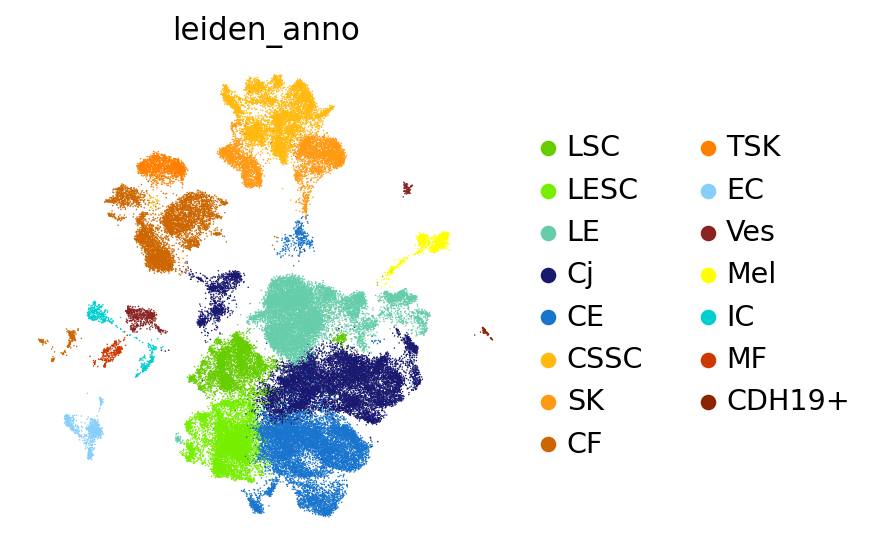

In [5]:
sc.pl.umap(
    adata_ref,
    color=["leiden_anno"],
    frameon=False,
    ncols=1,
)

In [6]:
# Load in kcn datasets
adata = sc.read("meta_kcn.h5ad")

# subset only KCN populations to query against the meta-atlas
adata = adata[~adata.obs['meta_labels_0.7'].isin(['NA'])]

# Remove the meta-atlas label column because it will need to be respecified
adata.obs = adata.obs.drop(columns=['scVI_label'])

In [7]:
# specify the query
adata_query = adata
adata_query.layers['counts'] = adata_query.X.copy()

In [8]:
adata_query = adata_query[:, adata_ref.var_names].copy()
adata_query.obs["batch"] = adata_query.obs["orig.ident"]

Update with query

In [10]:
# Save the reference model
#dir_path = "KCN_model_21062022/"

#if not os.path.exists("/ceph/rimlsfnwi/data/moldevbio/zhou/jarts/jupyter_notebooks/KCN_model_21062022/model_params.pt"): 
   # vae_ref.save(dir_path, overwrite=True)

In [9]:
# load the reference model
dir_path = "meta_atlas_model_20062022/"

In [10]:
# both are valid
vae_q = scvi.model.SCVI.load_query_data(
    adata_query,
    dir_path,
)

INFO     .obs[_scvi_labels] not found in target, assuming every cell is same category        
INFO     Using data from adata.X                                                             
INFO     Registered keys:['X', 'batch_indices', 'labels']                                    
INFO     Successfully registered anndata object containing 1131 cells, 2000 vars, 6 batches, 
         1 labels, and 0 proteins. Also registered 0 extra categorical covariates and 0 extra
         continuous covariates.                                                              


/vol/mbconda/julian/envs/scVItools/lib/python3.9/site-packages/scvi/model/base/_archesmixin.py:95: UserWarning: Query integration should be performed using models trained with version >= 0.8
  warnings.warn(
/vol/mbconda/julian/envs/scVItools/lib/python3.9/site-packages/sklearn/utils/deprecation.py:87: FutureWarning: Function transfer_anndata_setup is deprecated; This method will be removed in 0.15.0. Please avoid building any new dependencies on it.
  warnings.warn(msg, category=FutureWarning)
/vol/mbconda/julian/envs/scVItools/lib/python3.9/site-packages/scvi/model/base/_base_model.py:150: UserWarning: Make sure the registered X field in anndata contains unnormalized count data.
  warnings.warn(


In [11]:
vae_q.train(max_epochs=200, plan_kwargs=dict(weight_decay=0.0))
adata_query.obsm["X_scVI"] = vae_q.get_latent_representation()

GPU available: False, used: False
TPU available: False, using: 0 TPU cores


Epoch 200/200: 100%|██████████████████████████████████████████████████████████| 200/200 [00:19<00:00, 10.33it/s, loss=420, v_num=1]


/vol/mbconda/julian/envs/scVItools/lib/python3.9/site-packages/scvi/model/base/_base_model.py:150: UserWarning: Make sure the registered X field in anndata contains unnormalized count data.
  warnings.warn(


In [12]:
sc.pp.neighbors(adata_query, use_rep="X_scVI")
sc.tl.leiden(adata_query)
sc.tl.umap(adata_query)

/vol/mbconda/julian/envs/scVItools/lib/python3.9/site-packages/anndata/_core/anndata.py:1228: FutureWarning: The `inplace` parameter in pandas.Categorical.reorder_categories is deprecated and will be removed in a future version. Reordering categories will always return a new Categorical object.
  c.reorder_categories(natsorted(c.categories), inplace=True)
... storing 'orig.ident' as categorical
/vol/mbconda/julian/envs/scVItools/lib/python3.9/site-packages/anndata/_core/anndata.py:1228: FutureWarning: The `inplace` parameter in pandas.Categorical.reorder_categories is deprecated and will be removed in a future version. Reordering categories will always return a new Categorical object.
  c.reorder_categories(natsorted(c.categories), inplace=True)
... storing 'Phase' as categorical
/vol/mbconda/julian/envs/scVItools/lib/python3.9/site-packages/anndata/_core/anndata.py:1228: FutureWarning: The `inplace` parameter in pandas.Categorical.reorder_categories is deprecated and will be removed i

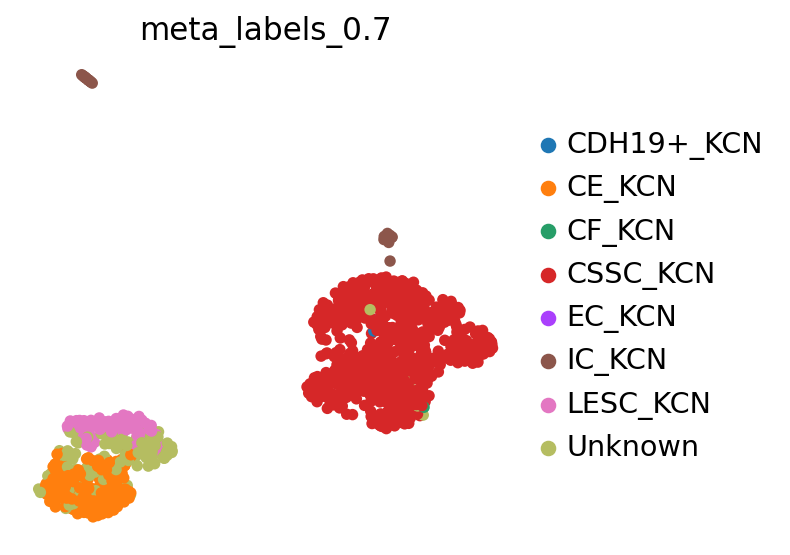

In [13]:
sc.pl.umap(
    adata_query,
    color=["meta_labels_0.7"],
    frameon=False,
    ncols=1,
)

#Visualize reference and query

In [14]:
adata_ref.obsm['X_scvi'] = vae_q.get_latent_representation(adata_ref)
adata_query.obsm['X_scvi'] = vae_q.get_latent_representation(adata_query)
adata_full = adata_query.concatenate(adata_ref, batch_key = 'bkey')

INFO     Using data from adata.X                                                             


/vol/mbconda/julian/envs/scVItools/lib/python3.9/site-packages/scvi/model/base/_base_model.py:150: UserWarning: Make sure the registered X field in anndata contains unnormalized count data.
  warnings.warn(
/vol/mbconda/julian/envs/scVItools/lib/python3.9/site-packages/scvi/data/_anndata.py:1234: UserWarning: Categorical encoding for batch is similar but not equal between the anndata used to train and the anndata passed in. Will attempt transfer. Expected categories: ['Ca' 'Co' 'Ga' 'Li' 'keraSRR12386367' 'keraSRR12386368']. Received categories: ['Ca' 'Co' 'Ga' 'Li'].
 
  warnings.warn(warning_msg.format(category, mapping1, mapping2))
/vol/mbconda/julian/envs/scVItools/lib/python3.9/site-packages/sklearn/utils/deprecation.py:87: FutureWarning: Function transfer_anndata_setup is deprecated; This method will be removed in 0.15.0. Please avoid building any new dependencies on it.
  warnings.warn(msg, category=FutureWarning)


INFO     Registered keys:['X', 'batch_indices', 'labels']                                    
INFO     Successfully registered anndata object containing 65036 cells, 2000 vars, 6 batches,
         1 labels, and 0 proteins. Also registered 0 extra categorical covariates and 0 extra
         continuous covariates.                                                              


/vol/mbconda/julian/envs/scVItools/lib/python3.9/site-packages/scvi/model/base/_base_model.py:150: UserWarning: Make sure the registered X field in anndata contains unnormalized count data.
  warnings.warn(


In [15]:
del adata_full.obsm['X_scVI']

In [16]:
adata_full.obsm["X_scVI"] = vae_q.get_latent_representation(adata_full)

INFO     Input adata not setup with scvi. attempting to transfer anndata setup               
INFO     Using data from adata.X                                                             


/vol/mbconda/julian/envs/scVItools/lib/python3.9/site-packages/sklearn/utils/deprecation.py:87: FutureWarning: Function transfer_anndata_setup is deprecated; This method will be removed in 0.15.0. Please avoid building any new dependencies on it.
  warnings.warn(msg, category=FutureWarning)


INFO     Registered keys:['X', 'batch_indices', 'labels']                                    
INFO     Successfully registered anndata object containing 66167 cells, 2000 vars, 6 batches,
         1 labels, and 0 proteins. Also registered 0 extra categorical covariates and 0 extra
         continuous covariates.                                                              


/vol/mbconda/julian/envs/scVItools/lib/python3.9/site-packages/scvi/model/base/_base_model.py:150: UserWarning: Make sure the registered X field in anndata contains unnormalized count data.
  warnings.warn(


In [17]:
adata_full

AnnData object with n_obs × n_vars = 66167 × 2000
    obs: 'orig.ident', 'nCount_RNA', 'nFeature_RNA', 'percent.mt', 'S.Score', 'G2M.Score', 'Phase', 'old.ident', 'RNA_snn_res.0.15', 'seurat_clusters', 'costum_clustering', 'Condition', 'pANN_0.25_0.06_1806', 'DF.classifications_0.25_0.06_1806', 'pANN_0.25_0.005_1289', 'DF.classifications_0.25_0.005_1289', 'RNA_snn_res.0.1', 'pANN_0.25_0.18_1347', 'DF.classifications_0.25_0.18_1347', 'pANN_0.25_0.14_831', 'DF.classifications_0.25_0.14_831', 'batch', 'Condition2', 'meta_labels', 'meta_labels_prob', 'meta_labels_0.7', '_scvi_batch', '_scvi_labels', 'leiden', 'leiden_0.0', 'leiden_0.05', 'leiden_0.1', 'leiden_0.15', 'leiden_0.2', 'leiden_0.25', 'leiden_0.3', 'leiden_0.35', 'leiden_0.4', 'leiden_0.45', 'leiden_0.5', 'leiden_0.55', 'leiden_0.6', 'leiden_0.65', 'leiden_0.7', 'leiden_0.75', 'leiden_0.8', 'leiden_0.85', 'leiden_0.9', 'leiden_0.95', 'leiden_anno', 'bkey'
    var: 'features', 'highly_variable-1', 'highly_variable_rank-1', 'means-

In [18]:
sc.pp.neighbors(adata_full, use_rep="X_scVI")
sc.tl.leiden(adata_full)
sc.tl.umap(adata_full)

/vol/mbconda/julian/envs/scVItools/lib/python3.9/site-packages/anndata/_core/anndata.py:1228: FutureWarning: The `inplace` parameter in pandas.Categorical.reorder_categories is deprecated and will be removed in a future version. Reordering categories will always return a new Categorical object.
  c.reorder_categories(natsorted(c.categories), inplace=True)
... storing 'orig.ident' as categorical
/vol/mbconda/julian/envs/scVItools/lib/python3.9/site-packages/anndata/_core/anndata.py:1228: FutureWarning: The `inplace` parameter in pandas.Categorical.reorder_categories is deprecated and will be removed in a future version. Reordering categories will always return a new Categorical object.
  c.reorder_categories(natsorted(c.categories), inplace=True)
... storing 'RNA_snn_res.0.15' as categorical
/vol/mbconda/julian/envs/scVItools/lib/python3.9/site-packages/anndata/_core/anndata.py:1228: FutureWarning: The `inplace` parameter in pandas.Categorical.reorder_categories is deprecated and will b

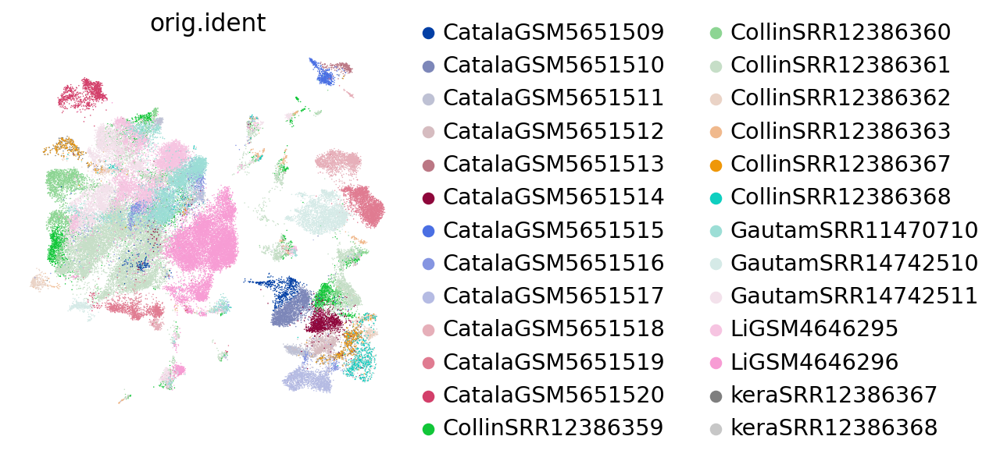

In [19]:
sc.pl.umap(
    adata_full,
    color=['orig.ident'],
    frameon=False,
    ncols=1,
)

In [20]:
# categorise wt and KCN to set different alphas for opacity/transparency
def categorise(row):  
    if row['batch'] == "keraSRR12386367":
        return 1
    elif row['batch'] == "keraSRR12386367":
        return 1
    return 0.15

adata_full.obs['map_alpha'] = adata_full.obs.apply(lambda row: categorise(row), axis=1)

In [21]:
# Set PDF printing for the co-embedded UMAP
sc.set_figure_params(scanpy=True, dpi=400, dpi_save=400, frameon=True, vector_friendly=True, fontsize=14, figsize=None, color_map=None, format='pdf', facecolor=None, transparent=False, ipython_format='png2x')

In [22]:
adata_full.obs['leiden_anno'] = adata_full.obs['leiden_anno'].cat.set_categories(list(adata_full.obs['leiden_anno'].cat.categories))

In [23]:
# Create the dataframe
def uncategorize(col):
    if col.dtype.name == 'category':
        try:
            return col.astype(col.cat.categories.dtype)
        except:
            # In case there is pd.NA (pandas >= 1.0), Int64 should be used instead of int64
            return col.astype(col.cat.categories.dtype.name.title())           
    else:
        return col
    
df = pd.DataFrame(adata_full.obs["leiden_anno"])
df = df.apply(uncategorize, axis=0)
# Apply the function
df = df.replace(np.nan, "KCN")
df

,leiden_anno
KCN_SRR12386367_AAACGAAAGTATCTGC-1-0,KCN
KCN_SRR12386367_AAACGCTGTGCGGCTT-1-0,KCN
KCN_SRR12386367_AAAGGATTCAAGAATG-1-0,KCN
KCN_SRR12386367_AAAGGGCCACCAGCCA-1-0,KCN
KCN_SRR12386367_AAAGGTAAGGAGCTGT-1-0,KCN
...,...
Gautam_SRR14742511_TTTGGTTTCCGTAGGC-1-1,CF
Gautam_SRR14742511_TTTGTTGAGGATGTTA-1-1,LSC
Gautam_SRR14742511_TTTGTTGCAGCCATTA-1-1,LSC
Gautam_SRR14742511_TTTGTTGTCCTATTTG-1-1,LSC


In [24]:
adata_full.obs['leiden_anno']=df
adata_full.obs['leiden_anno']

KCN_SRR12386367_AAACGAAAGTATCTGC-1-0       KCN
KCN_SRR12386367_AAACGCTGTGCGGCTT-1-0       KCN
KCN_SRR12386367_AAAGGATTCAAGAATG-1-0       KCN
KCN_SRR12386367_AAAGGGCCACCAGCCA-1-0       KCN
KCN_SRR12386367_AAAGGTAAGGAGCTGT-1-0       KCN
                                          ... 
Gautam_SRR14742511_TTTGGTTTCCGTAGGC-1-1     CF
Gautam_SRR14742511_TTTGTTGAGGATGTTA-1-1    LSC
Gautam_SRR14742511_TTTGTTGCAGCCATTA-1-1    LSC
Gautam_SRR14742511_TTTGTTGTCCTATTTG-1-1    LSC
Gautam_SRR14742511_TTTGTTGTCGGAGTAG-1-1     CF
Name: leiden_anno, Length: 66167, dtype: object

In [25]:
category_order_list = ["LSC","LESC","LE","Cj","CE","Mel","CSSC","SK","TSK","CF","MF","Ves","EC","IC","CDH19+","KCN"]
adata_full.obs['leiden_anno'] = adata_full.obs['leiden_anno'].astype("category")
adata_full.obs['leiden_anno'] = adata_full.obs['leiden_anno'].cat.set_categories(category_order_list, ordered=True)
adata_full.obs['leiden_anno'].unique()

['KCN', 'Cj', 'CSSC', 'LESC', 'CE', ..., 'IC', 'CDH19+', 'LE', 'EC', 'TSK']
Length: 16
Categories (16, object): ['LSC' < 'LESC' < 'LE' < 'Cj' ... 'EC' < 'IC' < 'CDH19+' < 'KCN']

/vol/mbconda/julian/envs/scVItools/lib/python3.9/site-packages/scanpy/plotting/_tools/scatterplots.py:1227: FutureWarning: Categorical.replace is deprecated and will be removed in a future version. Use Series.replace directly instead.
  values = values.replace(values.categories.difference(groups), np.nan)


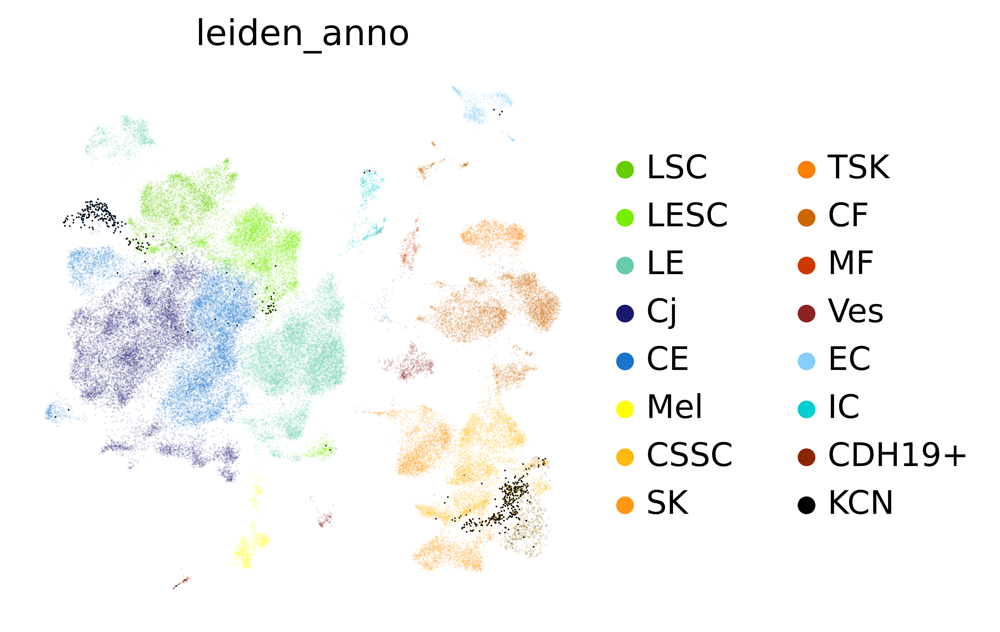

In [26]:
sc.pl.umap(
    adata_full,
    color=['leiden_anno'],
    frameon=False,
    ncols=1,
        palette={
        "KCN": "black",
        "SK": "#FF9912",
        "CDH19+": "#8B2500",
        "CE": "#1874CD",
        "CF": "#CD6600",
        "Cj": "#191970",
        "EC": "#87CEFA",
        "MF": "#CD3700",
        "IC": "#00CED1",
        "LE": "#66CDAA",
        "Mel": "#FFFF00",
       "CSSC": "#FFB90F",
       "TSK": "#FF7F00",
       "Ves": "#8B2323",
       "LSC": "#66CD00",
       "LESC": "#76EE00"
    },alpha=adata_full.obs['map_alpha'].values,sort_order=False,groups=adata_full.obs['leiden_anno'].unique()
,save='.pdf') #,groups= category_order_list

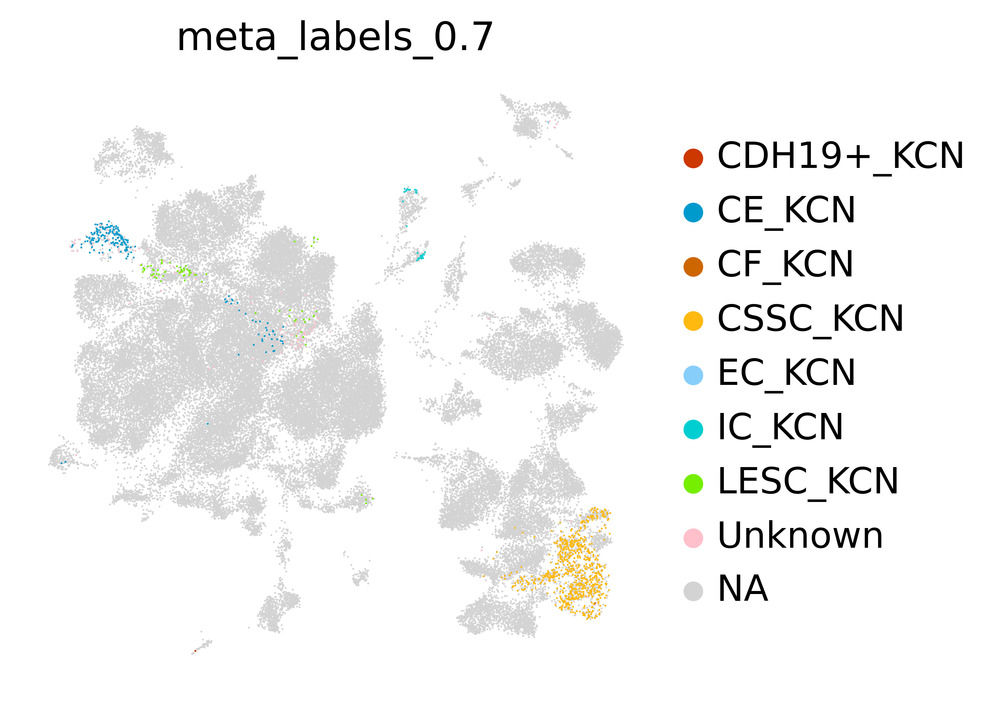

In [27]:
sc.pl.umap(
    adata_full,
    color=["meta_labels_0.7"],
    frameon=False,
    ncols=1,
    palette={
        "LESC_KCN": "#76EE00",
        "CE_KCN": "#009ACD",
        "CSSC_KCN": "#FFB90F",
        "CF_KCN": "#CD6600",
        "EC_KCN": "#87CEFA",
        "IC_KCN": "#00CED1",
        "CDH19+_KCN": "#CD3700",
        "Unknown": "pink",
    },
)

# Visualize Collin wt data together with KCN datasets

In [28]:
def categorise(row):  
    if row['batch'] == "Co":
        return 'Collin_meta'
    elif row['meta_labels_0.7'] == "LESC_KCN":
        return 'LESC_KCN'
    elif row['meta_labels_0.7'] == "CE_KCN":
        return 'CE_KCN'
    elif row['meta_labels_0.7'] == "CSSC_KCN":
        return 'CSSC_KCN'
    elif row['meta_labels_0.7'] == "CF_KCN":
        return 'CF_KCN'
    elif row['meta_labels_0.7'] == "EC_KCN":
        return 'EC_KCN'
    elif row['meta_labels_0.7'] == "IC_KCN":
        return 'IC_KCN'
    elif row['meta_labels_0.7'] == "CDH19+_KCN":
        return 'CDH19+_KCN'
    elif row['meta_labels_0.7'] == "Unknown":
        return 'Unknown'
    return "Meta_remainder"

In [29]:
adata_full.obs['map'] = adata_full.obs.apply(lambda row: categorise(row), axis=1)

In [30]:
adata_full.obs["map"]=adata_full.obs["map"].astype('category')

In [31]:
adata_full.obs["map"].cat.reorder_categories(["LESC_KCN","CE_KCN","CSSC_KCN","CF_KCN","EC_KCN","IC_KCN","CDH19+_KCN","Unknown","Collin_meta","Meta_remainder"], inplace=True)

/scratch/julian/tmp/6tlZ/ipykernel_1736300/383806122.py:1: FutureWarning: The `inplace` parameter in pandas.Categorical.reorder_categories is deprecated and will be removed in a future version. Reordering categories will always return a new Categorical object.
  adata_full.obs["map"].cat.reorder_categories(["LESC_KCN","CE_KCN","CSSC_KCN","CF_KCN","EC_KCN","IC_KCN","CDH19+_KCN","Unknown","Collin_meta","Meta_remainder"], inplace=True)


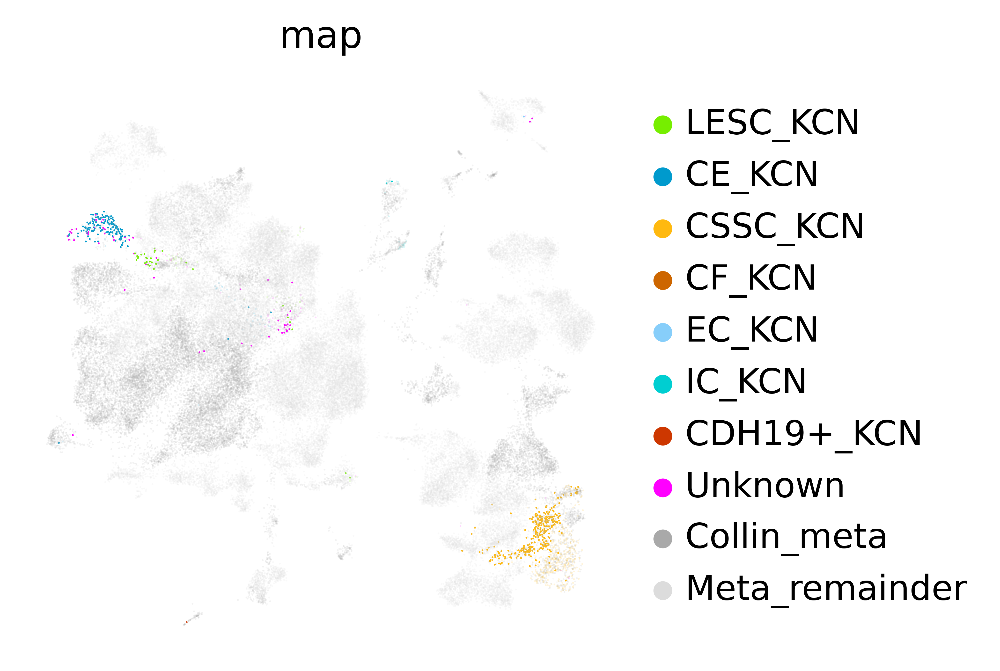

In [33]:
sc.pl.umap(
    adata_full,
    color=["map"],
    frameon=False,
    ncols=1,
    palette={
        "LESC_KCN": "#76EE00",
        "CE_KCN": "#009ACD",
        "CSSC_KCN": "#FFB90F",
        "CF_KCN": "#CD6600",
        "EC_KCN": "#87CEFA",
        "IC_KCN": "#00CED1",
        "CDH19+_KCN": "#CD3700",
        "Unknown": "magenta",
        "Collin_meta": "darkgrey",
        "Meta_remainder": "gainsboro",
    },alpha=adata_full.obs['map_alpha'].values
,save='meta_high.pdf')